<a href="https://colab.research.google.com/github/MuhammadFaridMauludin/PCVK_Ganjil_2025/blob/main/pertemuan_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Percobaan Praktikum

## Global Treshold

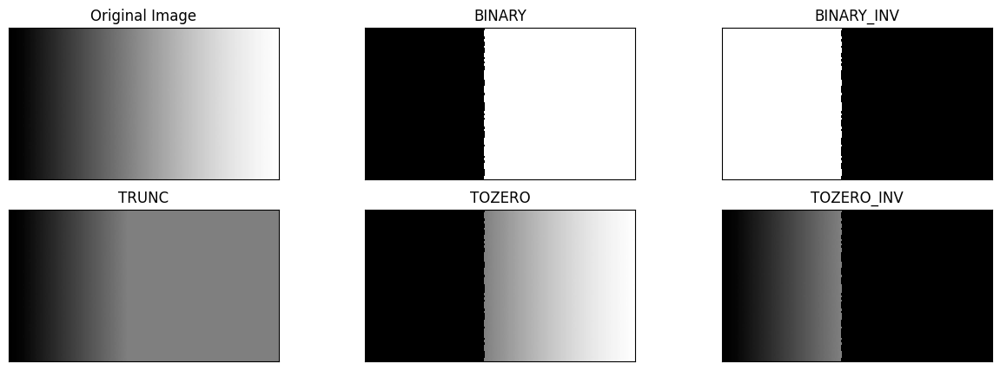

In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/gradient.jpg'
img = cv.imread(filename)

thresh = 127  # nilai Threshold yang ditentukan

# 1. thresh1 jika pixel di img > 127, maka thresh1 bernilai 1 (putih), selain itu bernilai 0 (hitam)
ret, thresh1 = cv.threshold(img, thresh, 255, cv.THRESH_BINARY)

# 2. thresh2 adalah binary threshold inverse
ret, thresh2 = cv.threshold(img, thresh, 255, cv.THRESH_BINARY_INV)

# 3. Threshold Truncate
ret, thresh3 = cv.threshold(img, thresh, 255, cv.THRESH_TRUNC)

# 4. Threshold Tozero
ret, thresh4 = cv.threshold(img, thresh, 255, cv.THRESH_TOZERO)

# 5. Threshold Tozero Inverse
ret, thresh5 = cv.threshold(img, thresh, 255, cv.THRESH_TOZERO_INV)

titles = ['Original Image', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(15, 5))
for i in range(len(images)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i], 'gray', interpolation='nearest')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()


## Adaptive Treshold

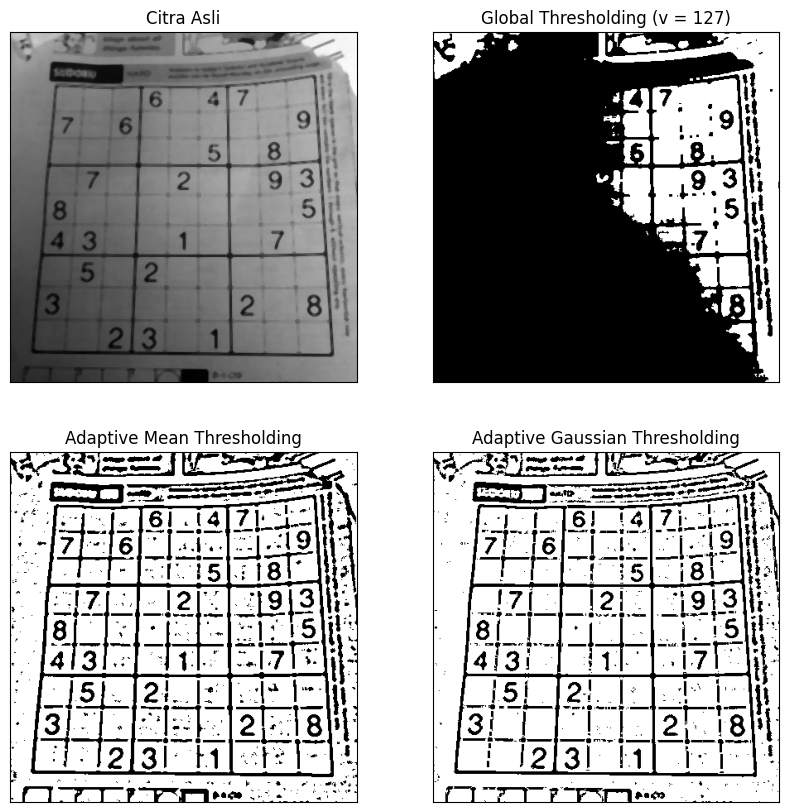

In [3]:
import cv2 as cv
import matplotlib.pyplot as plt

filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/sudoku-original.jpg'

citra = cv.medianBlur(cv.imread(filename), 5)
gray = cv.cvtColor(citra, cv.COLOR_BGR2GRAY)
# gray = cv.medianBlur(gray, 5)

thresh = 127
ret, th1 = cv.threshold(gray, thresh, 255, cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 2)
th3 = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 2)

titles = [
    'Citra Asli',
    'Global Thresholding (v = 127)',
    'Adaptive Mean Thresholding',
    'Adaptive Gaussian Thresholding'
]

citra2 = [gray, th1, th2, th3]

plt.figure(figsize=(10, 10))
for i in range(len(citra2)):
    plt.subplot(2, 2, i + 1)
    plt.imshow(citra2[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()


## Otsu treshold

/tmp/ipython-input-531595829.py:21: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(blur.ravel(), 256, [50, 200])


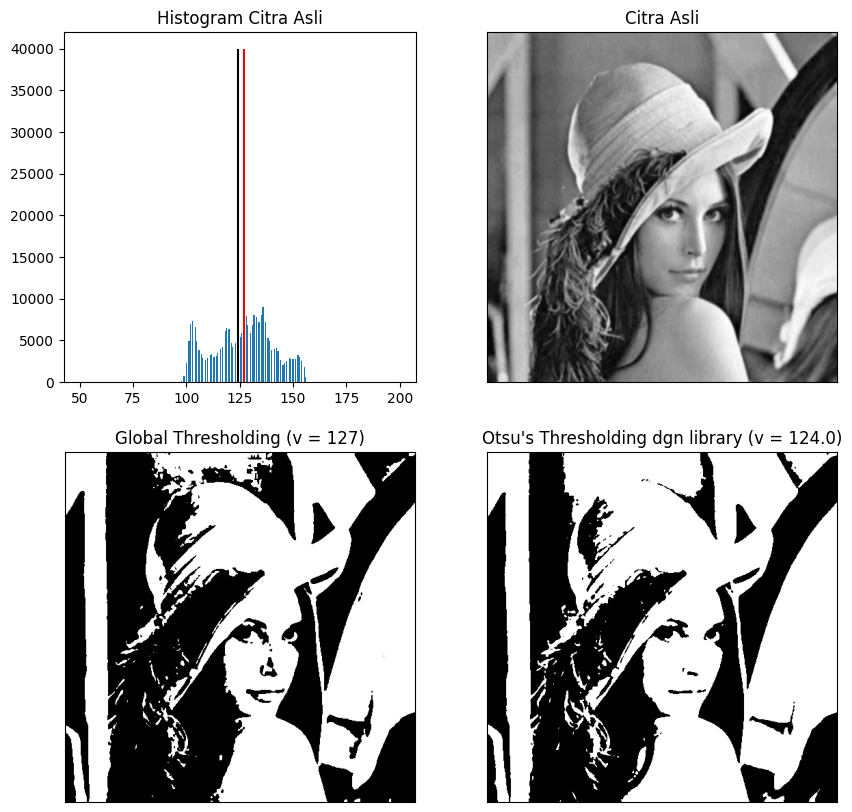

In [4]:
import cv2 as cv
import matplotlib.pyplot as plt

# Dengan Library
filename = '/content/drive/MyDrive/pcvk/lena_lc.jpg'
img = cv.imread(filename, 0)
blur = cv.GaussianBlur(img, (5, 5), 0)
thresh = 127

ret, th1 = cv.threshold(blur, thresh, 255, cv.THRESH_BINARY)
ret2, th2 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

x = "Otsu's Thresholding dgn library (v = " + str(ret2) + ")"
titles = ['Citra Asli', 'Global Thresholding (v = 127)', x]
citra3 = [blur, th1, th2]

plt.figure(figsize=(10, 10))

# Histogram
plt.subplot(2, 2, 1)
plt.hist(blur.ravel(), 256, [50, 200])
plt.vlines(ret, 0, 40000, colors='red')   # garis vertikal merah menunjukkan threshold global 127
plt.vlines(ret2, 0, 40000, colors='black')  # garis vertikal hitam menunjukkan threshold 92 hasil Otsu's
plt.title('Histogram Citra Asli')

# Tampilkan citra hasil thresholding
for i in range(len(citra3)):
    plt.subplot(2, 2, i + 2)
    plt.imshow(citra3[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()


## hasil otsu treshold dengan gaussian filter dan tanpa gaussian

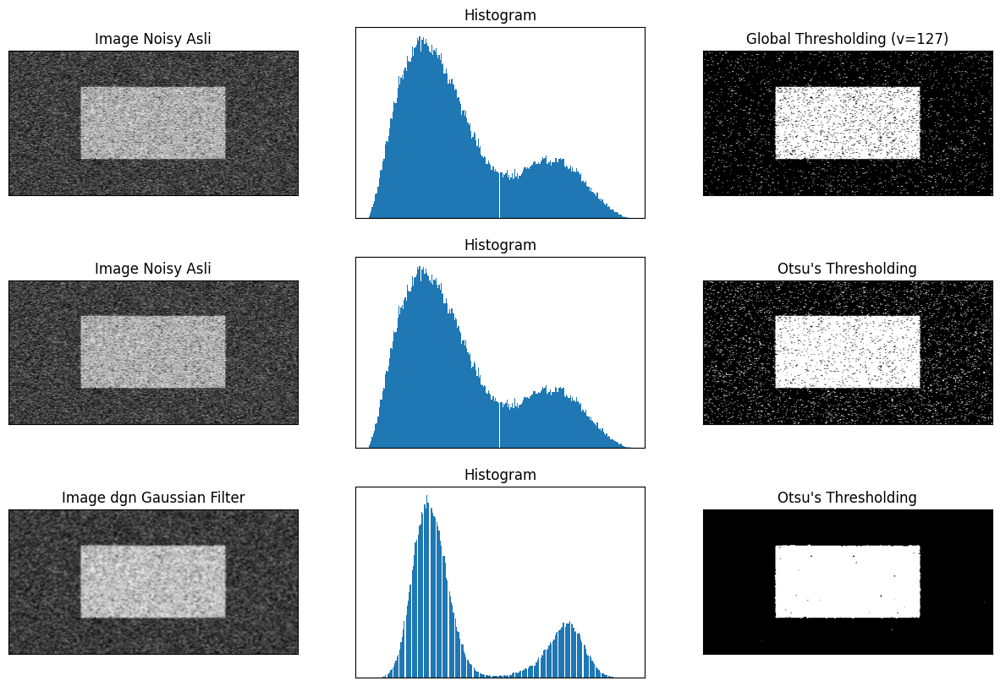

In [5]:
import cv2 as cv
import matplotlib.pyplot as plt

filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/noisy2.png'
img = cv.imread(filename, 0)

# Global Thresholding
ret1, th1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)

# Otsu's thresholding
ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Otsu's thresholding setelah dilakukan Gaussian filtering
blur = cv.GaussianBlur(img, (5, 5), 0)
ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Plotting semua image
images = [
    img, 0, th1,
    img, 0, th2,
    blur, 0, th3
]

titles = [
    'Image Noisy Asli', 'Histogram', 'Global Thresholding (v=127)',
    'Image Noisy Asli', 'Histogram', "Otsu's Thresholding",
    'Image dgn Gaussian Filter', 'Histogram', "Otsu's Thresholding"
]

plt.figure(figsize=(15, 10))

for i in range(3):
    plt.subplot(3, 3, i * 3 + 1)
    plt.imshow(images[i * 3], 'gray')
    plt.title(titles[i * 3])
    plt.xticks([]), plt.yticks([])

    plt.subplot(3, 3, i * 3 + 2)
    plt.hist(images[i * 3].ravel(), 256)
    plt.title(titles[i * 3 + 1])
    plt.xticks([]), plt.yticks([])

    plt.subplot(3, 3, i * 3 + 3)
    plt.imshow(images[i * 3 + 2], 'gray')
    plt.title(titles[i * 3 + 2])
    plt.xticks([]), plt.yticks([])

plt.show()


## Segmentasi citra menggunakan k means

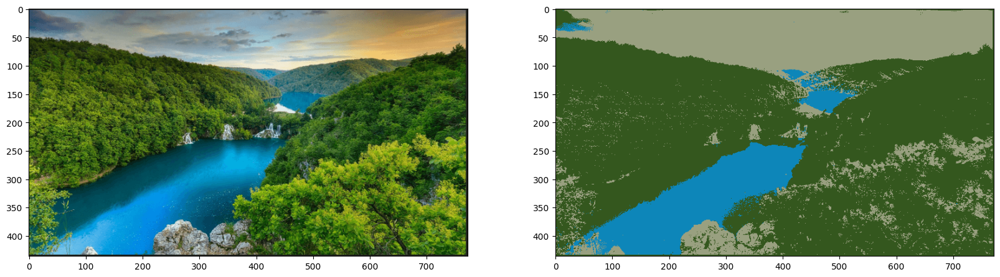

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# KMeans Image Segmentation
filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/jungle.png'
img = cv.imread(filename)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

'''
Kita akan menggunakan fungsi cv.kmeans() yang meminta array 2D sebagai masukan,
sedangkan image aslinya adalah array 3D.
Selanjutnya kita perlu melakukan flattening array image masukan.
'''

# Reshape array ke bentuk 2D
pixel_values = img.reshape((-1, 3))

# Convert to float
pixel_values = np.float32(pixel_values)

'''
Syarat berhenti iterasi dari KMeans adalah jika centroid sudah tidak terlalu banyak pergeseran posisi
antara iterasi sekarang dengan iterasi sebelumnya (konvergen).
Karena jumlah data yang besar, maka kita akan hentikan iterasi saat jumlah iterasi = 100
atau epsilon (selisih antara posisi centroid sekarang dengan posisi centroid di iterasi sebelumnya) < 0.2
'''
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)

'''
Jika diperhatikan pada image asli, terdapat 3 warna utama (hijau, biru, dan putih/orange).
Untuk percobaan ini kita akan gunakan 3 cluster untuk image ini.
'''
k = 3
_, labels, centers = cv.kmeans(pixel_values, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

# Konversi titik centroid ke dalam integer
centers = np.uint8(centers)

# Flattening label array
labels = labels.flatten()

# Konversi warna pixel asli ke warna dari tiap centroid-nya
segmented_image = centers[labels.flatten()]

# Reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img.shape)

# Tampilkan hasil
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1), plt.imshow(img)
plt.subplot(1, 2, 2), plt.imshow(segmented_image)
plt.show()


## lanjutan untuk mengubah warna tertentu

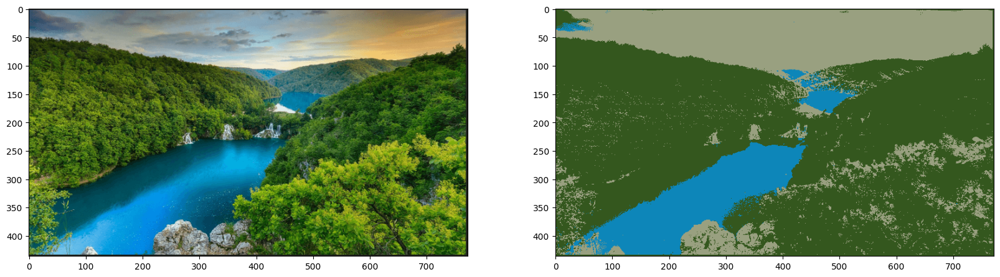

(<Axes: >, <matplotlib.image.AxesImage at 0x7ceee6bd5c70>)

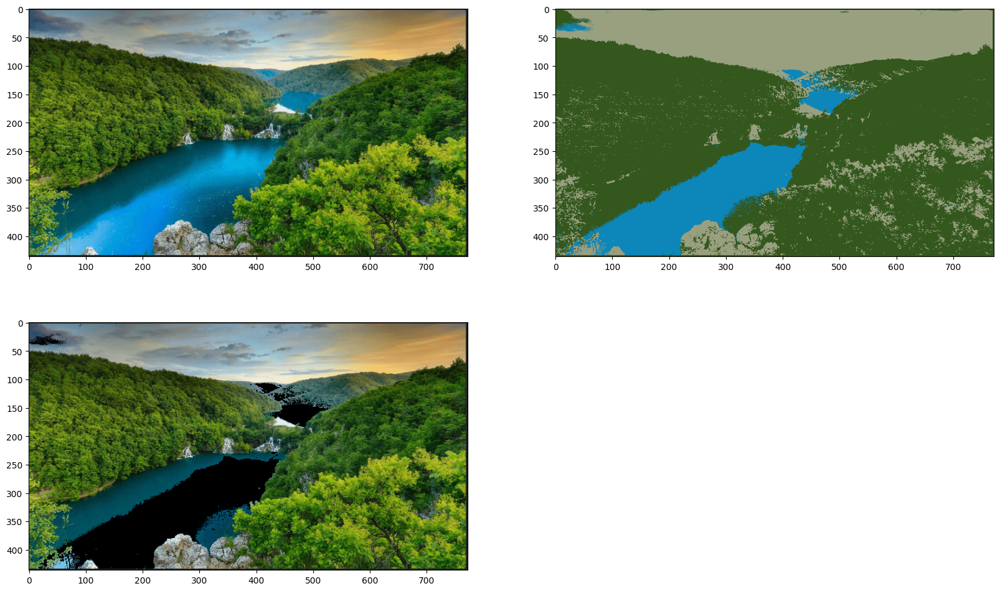

In [7]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# KMeans Image Segmentation
filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/jungle.png'
img = cv.imread(filename)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

'''
Kita akan menggunakan fungsi cv.kmeans() yang meminta array 2D sebagai masukan,
sedangkan image aslinya adalah array 3D.
Selanjutnya kita perlu melakukan flattening array image masukan.
'''

# Reshape array ke bentuk 2D
pixel_values = img.reshape((-1, 3))

# Convert to float
pixel_values = np.float32(pixel_values)

'''
Syarat berhenti iterasi dari KMeans adalah jika centroid sudah tidak terlalu banyak pergeseran posisi
antara iterasi sekarang dengan iterasi sebelumnya (konvergen).
Karena jumlah data yang besar, maka kita akan hentikan iterasi saat jumlah iterasi = 100
atau epsilon (selisih antara posisi centroid sekarang dengan posisi centroid di iterasi sebelumnya) < 0.2
'''
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)

'''
Jika diperhatikan pada image asli, terdapat 3 warna utama (hijau, biru, dan putih/orange).
Untuk percobaan ini kita akan gunakan 3 cluster untuk image ini.
'''
k = 3
_, labels, centers = cv.kmeans(pixel_values, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

# Konversi titik centroid ke dalam integer
centers = np.uint8(centers)

# Flattening label array
labels = labels.flatten()

# Konversi warna pixel asli ke warna dari tiap centroid-nya
segmented_image = centers[labels.flatten()]

# Reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img.shape)

# Tampilkan hasil
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1), plt.imshow(img)
plt.subplot(1, 2, 2), plt.imshow(segmented_image)
plt.show()

# ubah pixel di cluster 2 menjadi hitam
masked_image = np.copy(img)
# konvert ke bentuk vektor
masked_image = masked_image.reshape((-1, 3))
# cluster yang diubah
cluster = 2
masked_image[labels == cluster] = [0, 0, 0]
# konvert ke bentuk asli
masked_image = masked_image.reshape(img.shape)
plt.figure(figsize = (20,12))
plt.subplot(2,2,1),plt.imshow(img)
plt.subplot(2,2,2),plt.imshow(segmented_image)
plt.subplot(2,2,3),plt.imshow(masked_image)

# Tugas Praktikum

# D1. Tugas Praktikum

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
!pip install pytesseract

In [10]:
import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

Buat Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan
threshold= 170, secara manual sesuai dengan deskripsi dari grafik yang ditunjukkan di
atas.

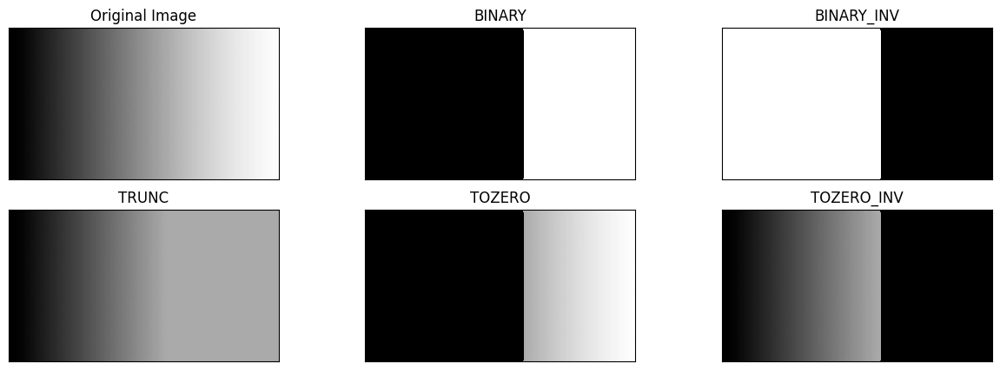

In [11]:
filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/gradient.jpg'
img = cv.imread(filename)

thresh1 = cv.imread(filename)
thresh2 = cv.imread(filename)
thresh3 = cv.imread(filename)
thresh4 = cv.imread(filename)
thresh5 = cv.imread(filename)

thresh = 170  # nilai Threshold yang ditentukan

# 1. thresh1 jika pixel di img > 127, maka thresh1 bernilai 1 (putih) selain itu bernilai 0 (hitam)
thresh1[img > thresh] = 255  # tanpa library
thresh1[img <= thresh] = 0

# 2. thresh2 adalah binary threshold inverse
thresh2 = 255 - thresh1  # tanpa library

# 3. Threshold Truncate
thresh3[img > thresh] = thresh  # tanpa library

# 4. Threshold Tozero
thresh4[img <= thresh] = 0  # tanpa library

# 5. Threshold Tozero Inverse
thresh5[img > thresh] = 0  # tanpa library

titles = ['Original Image', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(15, 5))
for i in range(len(images)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i], 'gray', interpolation='nearest')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()

Buat Otsu Thresholding tanpa menggunakan Library. Tampilkan juga nilai threshold
saat anda gunakan Otsu’s, seperti terlihat pada gambar hasil berikut. (gunakan image
ktp Riyanto.jpg agar terlihat beda antara hasil otsu’s dengan global threshold biasa)

167


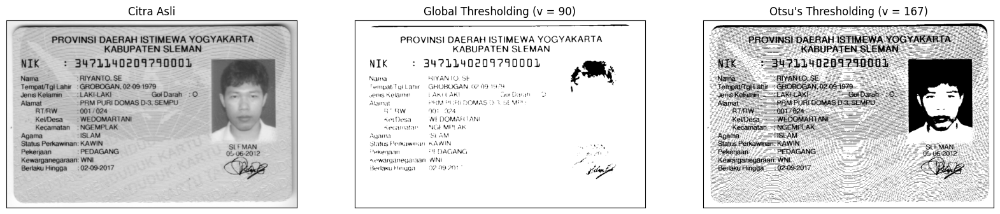

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = '/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/ktp.png'
img = cv.imread(filename, 0)
blur = cv.GaussianBlur(img, (5, 5), 0)

def otsu(gray):
    pixel_number = gray.shape[0] * gray.shape[1]
    mean_weight = 1.0 / pixel_number
    his, bins = np.histogram(gray, np.arange(0, 257))
    final_thresh = -1
    final_value = -1
    intensity_arr = np.arange(256)

    for t in bins[1:-1]:  # This goes from 1 to 254 uint8 range
        pcb = np.sum(his[:t])
        pcf = np.sum(his[t:])
        Wb = pcb * mean_weight
        Wf = pcf * mean_weight
        mub = np.sum(intensity_arr[:t] * his[:t]) / float(pcb)
        muf = np.sum(intensity_arr[t:] * his[t:]) / float(pcf)
        value = Wb * Wf * (mub - muf) ** 2

        if value > final_value:
            final_thresh = t
            final_value = value

    final_img = gray.copy()
    print(final_thresh)
    final_img[gray > final_thresh] = 255
    final_img[gray < final_thresh] = 0

    return final_img, final_thresh

otsu_biner, otsu_thresh = otsu(img)
x = "Otsu's Thresholding (v = " + str(otsu_thresh) + ")"

ret, th1 = cv.threshold(blur, 90, 255, cv.THRESH_BINARY)
# ret, th2 = cv.threshold(blur, thresh, 255, cv.THRESH_BINARY)

titles = ['Citra Asli', 'Global Thresholding (v = 90)', x]
citra3 = [blur, th1, otsu_biner]

plt.figure(figsize=(20, 15))
for i in range(len(citra3)):
    plt.subplot(1, 3, i + 1)
    plt.imshow(citra3[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()


Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image
saja. Gunakan image ktp Riyanto.jpg yang sudah disediakan di folder images.

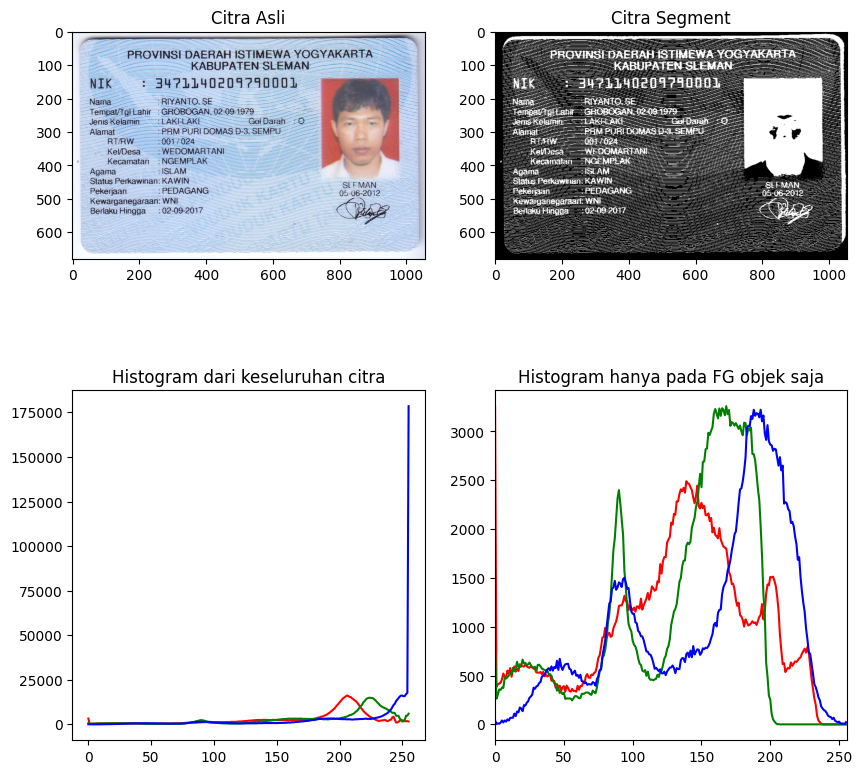

In [13]:
filename = ('/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/ktp.png')
img = cv.imread(filename)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
ret3, mask = cv.threshold(img_gray, 200, 255, cv.THRESH_BINARY_INV)

plt.figure(figsize=(10,10))
plt.subplot(2,2,1), plt.imshow(img)
plt.title('Citra Asli')

plt.subplot(2,2,2), plt.imshow(mask, 'gray')
plt.title('Citra Segment')

color = ('r', 'g', 'b')
for i, col in enumerate(color):
    hist0 = cv.calcHist([img], [i], None, [256], [0,256])
    plt.subplot(2,2,3), plt.plot(hist0, color=col)
    plt.title('Histogram dari keseluruhan citra')

    hist1 = cv.calcHist([img], [i], mask, [256], [0,256])
    plt.subplot(2,2,4), plt.plot(hist1, color=col)
    plt.title('Histogram hanya pada FG objek saja')

plt.xlim([0,256])
plt.show()


Lakukan segmentasi warna pada image " ktp Riyanto.jpg ", munculkan hanya warna
yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya
warna tertentu saja)

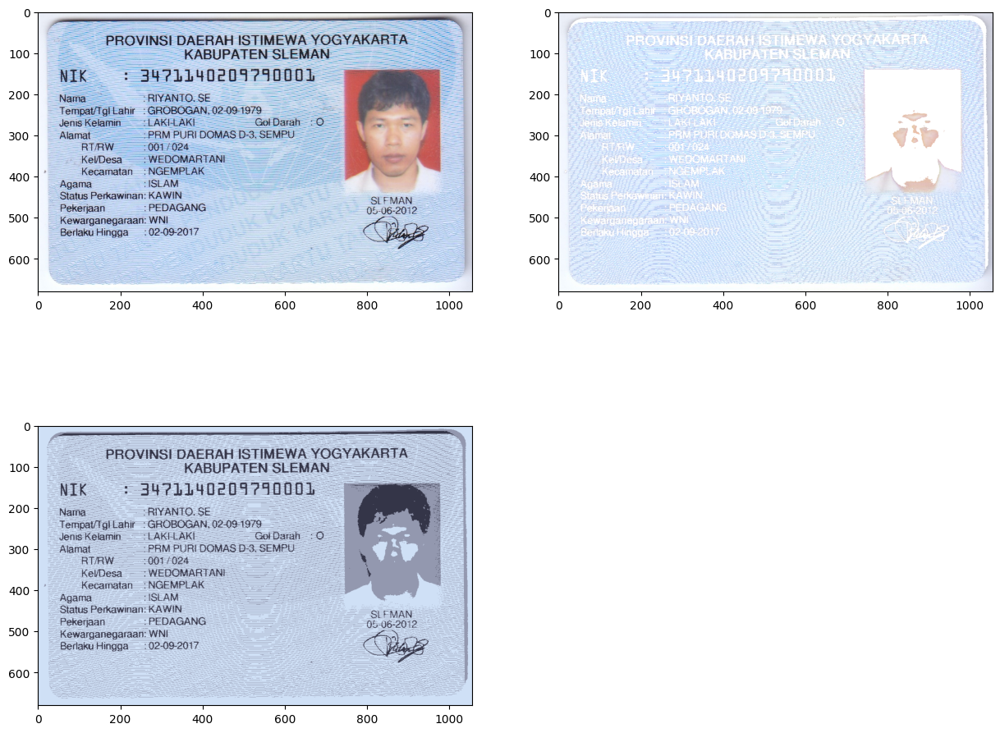

In [14]:
filename = ('/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/ktp.png')
img = cv.imread(filename)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

'''
kita akan menggunakan fungsi cv.kmeans() yang meminta array 2D sebagai masukan,
sedangkan image aslinya adalah array 3D
selanjutnya kita perlu melakukan flattening array image masukan
'''

# reshape array ke bentuk 2D
pixel_values = img.reshape((-1, 3))

# convert to float
pixel_values = np.float32(pixel_values)

'''
syarat berhenti iterasi dari KMeans adalah jika centroid sudah tidak terlalu banyak
pergeseran posisi antara iterasi sekarang
dengan iterasi sebelumnya (konvergen). Karena jumlah data yang besar, maka kita
akan hentikan iterasi saat jumlah iterasi = 100
atau epsilon (selisih antara posisi centroid sekarang dengan posisi centroid di iterasi
sebelumnya) < 0.2
'''
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 150, 0.1)

'''
jika diperhatikan pada image asli, terdapat 3 warna utama (hijau, biru, dan
putih/orange). untuk percobaan ini kita akan gunakan
3 cluster untuk image ini
'''
k = 3
_, labels, centers = cv.kmeans(pixel_values, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

# konversi titik centroid ke dalam integer
centers = np.uint8(centers)

# flattening label array
labels = labels.flatten()

# konversi warna pixel asli ke warna dari tiap centroid-nya
segmented_image = centers[labels.flatten()]

# reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img.shape)

masked_image = np.copy(img)
masked_image0 = masked_image.reshape((-1, 3))
masked_image0[labels != 1] = [255, 255, 255]
masked_image0 = masked_image0.reshape(img.shape)

plt.figure(figsize=(15,12))
plt.subplot(2,2,1), plt.imshow(img)
plt.subplot(2,2,2), plt.imshow(masked_image0)
plt.subplot(2,2,3), plt.imshow(segmented_image)
plt.show()


Proses konversi gambar KTP menjadi teks yang dapat mengenali tulisan.

In [15]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tesseract-ocr-ind
0 upgraded, 1 newly installed, 0 to remove and 41 not upgraded.
Need to get 537 kB of archives.
After this operation, 1,138 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-ind all 1:4.00~git30-7274cfa-1.1 [537 kB]
Fetched 537 kB in 4s (128 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tesseract-ocr-ind.
(Reading databa

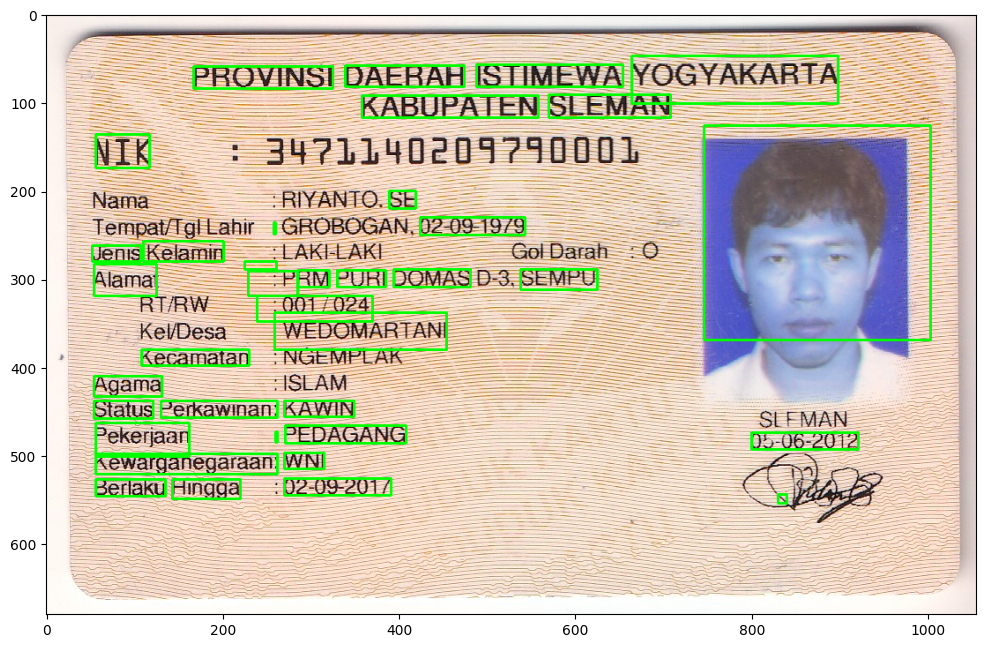

In [28]:
# fungsi untuk menampilkan gambar
def display(img, cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')
    plt.show()

# baca gambar
img = cv2.imread('/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/ktp.png')

# pra-pemrosesan
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.convertScaleAbs(gray, alpha=1.5, beta=0)
_, threshed = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# OCR
data = pytesseract.image_to_data(threshed, output_type=Output.DICT, lang='eng')

# buat kotak di sekitar teks dengan confidence > 60
n_boxes = len(data['text'])
for i in range(n_boxes):
    if int(data['conf'][i]) > 60:
        (x, y, w, h) = (data['left'][i], data['top'][i], data['width'][i], data['height'][i])
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

# tampilkan hasil
display(img)

===== TEKS TERBACA DARI GAMBAR =====

 

PROVINSI DAERAH ISTIMEWA YOGYAKARTA
KABUPATEN SLEMAN

NIK : 34711140209710001

 

Nama RIYANIO. St
Tempat/Tgi Lahir - GROBOGAN. 92 09 1979
Jenis Kelamin LAKI LAKI Golaran 0
Alamat PRM BERI DOMAS D 3. SEMPL
RT RW 661 924

KelDesa WEDOMAR IAN:
Kecamatan NGEMPL AK

 

Agama SI AM
Status Perkawinan: KAWIN . AN
Pekerjaan PEDAGANG Aa 6.20 »

 

Kewarganegaraan WNI
Berlaru Hingga 92-09-2017

 



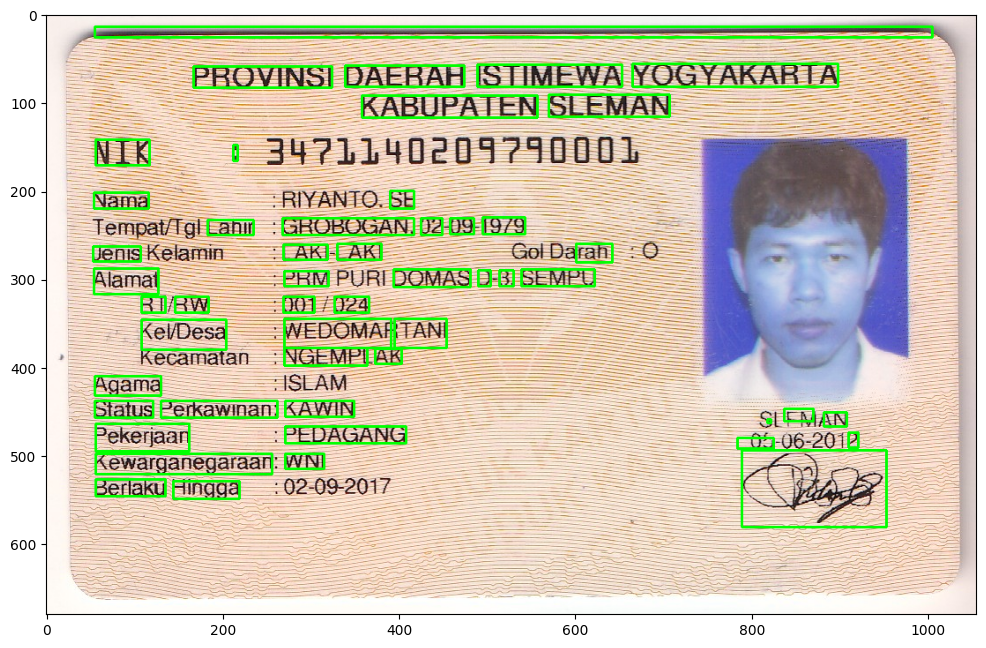

In [31]:
# --- Fungsi untuk menampilkan gambar ---
def display(img, cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')
    plt.show()

# --- Baca gambar ---
img = cv2.imread('/content/drive/MyDrive/pcvk/Gambar Jobsheet 9/ktp.png')

# --- Pra-pemrosesan gambar ---
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.convertScaleAbs(gray, alpha=1.8, beta=10)   # tingkatkan kontras & kecerahan
gray = cv2.medianBlur(gray, 3)                         # kurangi noise
_, threshed = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# --- Jalankan OCR ---
text1 = pytesseract.image_to_data(threshed, output_type='data.frame', lang='ind')
text2 = pytesseract.image_to_string(threshed, lang='ind')

# --- Tampilkan hasil teks di output bawah ---
print("===== TEKS TERBACA DARI GAMBAR =====\n")
print(text2)

# --- Filter hasil OCR yang valid ---
text = text1[text1.conf != -1]

# --- Kelompokkan berdasarkan blok teks ---
lines = text.groupby('block_num')['text'].apply(list)
conf = text.groupby(['block_num'])['conf'].mean()

# --- Buat kotak di sekitar teks dengan confidence > 60 ---
n_boxes = len(text['text'])
for i in range(n_boxes):
    if int(text['conf'].iloc[i]) > 60:
        (x, y, w, h) = (int(text['left'].iloc[i]), int(text['top'].iloc[i]),
                        int(text['width'].iloc[i]), int(text['height'].iloc[i]))
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

# --- Tampilkan hasil akhir ---
display(img)